## Abstract

In this work, the n-body simulation is generated by solving ordinary differential equation derived from the Newton's law of gravitation. The O.D.E is solved by two different methods. The first method is using the Scipy library and the second is method is done with the self implemented Runge-Kutta method. The two methods give the same result within the small time interval; however in the long run (if the system is chaotic) the results varies due to error that occur from the difference in step sizes and methods.

## Brief explanation of the code

I've decided to create a python class to represent each object in motion the name of this class is "object". This choice of using a class to represent each objects helps to generate the acceleration of each objects at each time step. However, it creates complication when used with the scipy library because the library require the data to be input in a specific format. This is the reason that two functions in the "Functions for changing types of data" are written. Thier purposes are to change the data from objects to array or vise versa for the purpose of plotting or solving O.D.E

The code is written such that it express the simulation in both 2 and 3 dimensional depending on the input given in object class. If the velocitie and position vectors of every objects are in 2 dimensional then the simulation will be 2 dimensional.

In [26]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.integrate import odeint

# Initial condition of the problem

This section is used to define the initial condition simply create objects and put into "init" list. 

Simply modify init for different outputs if position and velocity has 3 components then result is in 3D if 2 components then 2D

In [ ]:
G = 1 #Gravitational constant is set to 1

obj0 = object(4,[0,0,0],[0,-1/np.sqrt(2),0])
obj1 = object(4,[1,0,0],[0,1/np.sqrt(2),0])
obj2 = object(0.0001,[1/2,np.sqrt(3)/2,0],[-np.sqrt(3/2),0,0])

# objn = object(mass,position,velocity)

init = [obj0,obj1,obj2]

## Define class and some useful functions

In [1]:
class object: #in cartesian coordinate
    def __init__(self,mass:float,position:list,velocity:list):
        position = np.array(position)
        velocity = np.array(velocity)
        self.m = mass
        self.q = position
        self.qx, self.qy = position[0], position[1]
        if len(self.q) == 3:
            self.qz = position[2]
            self.vz = velocity[2]
        self.v = velocity
        self.vx, self.vy = velocity[0], velocity[1]

    def __repr__(self):
        return f"object({self.m},{self.q},{self.v})"
        
def q_vec(obj1,obj2): #vector pointing from position of one object to the other
    return obj2.q-obj1.q

def distance(obj1,obj2): #distance between two objects
    return np.sqrt(sum([(obj1.q[i] - obj2.q[i])**2 for i in range(len(obj1.q))]))
    s = 0
    for i in range(len(obj1.q)):
        e = obj1.q[i] - obj2.q[i]
        s += e**2
    return np.sqrt(s)

def random_object(D2 = True): #True for 2 dimensional, False for 3 dimensional
    if D2:
        return object(np.random.uniform(0,10),np.random.uniform(-1,1,2),np.random.uniform(-5,5,2))
    else:
        return object(np.random.uniform(0,10),np.random.uniform(0,4,3),np.random.uniform(-5,5,3))

### Functions for changing types of data

In [29]:
def obj_to_arr(state): #take data from state to arr for plot [xpos;ypos;zpos;xvel;yvel;zvel]
    q_lst, v_lst = [i.q for i in state], [i.v for i in state]
    q_arr, v_arr = np.array(q_lst), np.array(v_lst)
    
    plot_state = []
    for e in range(len(init[0].q)):
        plot_state.append(q_arr[:,e])
    for ve in range(len(init[0].v)):
        plot_state.append(v_arr[:,ve])
        
    plot_state = np.array(plot_state)
    plot_state = plot_state.flatten()

    return plot_state

def arr_to_obj(state,init): #take data from arr state to object type for use of acceleration function
    n = len(init)
    obj_state = []
    if len(init[0].q) == 2:
        for i in range(0,n):
            obj = object(init[i].m,np.array([state[i],state[i+n]]),np.array([state[i+2*n],state[i+3*n]]))
            obj_state.append(obj)
    else:
        for i in range(0,n):
            obj = object(init[i].m,np.array([state[i],state[i+n],state[i+2*n]]),np.array([state[i+3*n],state[i+4*n],state[5*n]]))
            obj_state.append(obj)
            
    return obj_state

## Gravitational force
The gravitational force felt one mass $m_i$ by mass $m_j$ is given by
$$
\begin{gather}
\mathbf{F}_{ij} = \frac{Gm_im_j}{||\mathbf{q_j}-\mathbf{q_i}||^2} \cdot \frac{\mathbf{q_j}-\mathbf{q_i}}{||\mathbf{q_j}-\mathbf{q_i}||} = \frac{Gm_im_j(\mathbf{q_j}-\mathbf{q_i})}{||\mathbf{q_j}-\mathbf{q_i}||^3}
\end{gather}
$$
here $\frac{\mathbf{q_j}-\mathbf{q_i}}{||\mathbf{q_j}-\mathbf{q_i}||}$ is the unit vector pointing from i to j

summing forces from n masses on i yields
$$
\begin{gather}
\mathbf{F}_{i} = \sum_{j=1\\j\neq i}^n\frac{Gm_im_j(\mathbf{q_j}-\mathbf{q_i})}{||\mathbf{q_j}-\mathbf{q_i}||^3} \\
\frac{d^2\mathbf{q_i}}{dt^2} = G\sum_{j=1\\j\neq i}^n\frac{m_j(\mathbf{q_j}-\mathbf{q_i})}{||\mathbf{q_j}-\mathbf{q_i}||^3}
\end{gather}
$$

In [ ]:
def acceleration(state,i):
    if type(state) is not list:
        state = arr_to_obj(state,init)
    return G*sum([state[j].m*q_vec(state[i],state[j])/distance(state[j],state[i])**3 for j in range(len(state)) if j != i])

## Solve by scipy

In [32]:
n = len(init)

def F(state,t):
    if len(state) == int(4*n): #2D
        return np.concatenate((
        (state[2*n:3*n]),state[3*n:4*n],
        [acceleration(state,i)[0] for i in range(n)],
        [acceleration(state,i)[1] for i in range(n)]))
    
    else: #3D
        return np.concatenate((
        (state[3*n:4*n]),state[4*n:5*n],state[5*n:6*n],
        [acceleration(state,i)[0] for i in range(n)],
        [acceleration(state,i)[1] for i in range(n)],
        [acceleration(state,i)[2] for i in range(n)]))

state0 = obj_to_arr(init)

t = np.linspace(0,1,10000)
solution = odeint(F,state0,t)

## Code for plotting each specific frame

In [ ]:
def pic(k=0):
    plt.clf()
    if len(init[0].q) == 2: #if 2D
        for i in range(n):
            color = plt.plot(solution[:k,i], solution[:k,n+i],linewidth=0.5)[0].get_color()
            plt.plot(solution[k,i], solution[k,n+i],"o",label=f"m: {np.round(init[i].m,4)}",color=color) 

        ax = plt.gca()
        ax.set_aspect(1)
        ax.set_xlim(-1.5,1.5)
        ax.set_ylim(-1.5,1.5)
        plt.legend()
        plt.axis('off');
        #plt.savefig("images/"+f"k={k}")
    
    else: #if 3D
        D3 = plt.figure().add_subplot(projection="3d")
        for i in range(n):
            xl, xd = solution[:k,i], solution[k,i]
            yl,yd = solution[:k,n+i], solution[k,n+i]
            zl,zd = solution[:k,2*n+i], solution[k,2*n+i]
            color = D3.plot(xl, yl,zl,linewidth=0.5)[0].get_color()
            D3.plot(xd, yd,zd,"o",label=f"m: {np.round(init[i].m,4)}",color=color) 
        D3.set_xticklabels([])
        D3.set_yticklabels([])
        D3.set_zticklabels([])
        D3.set_xlabel("x")
        D3.set_ylabel("y")
        D3.set_zlabel("z")
        D3.set_xlim(-2,2)
        D3.set_ylim(-2,2)
        D3.set_zlim(-2,2)
        plt.legend()
        #plt.savefig("images/"+f"k={k}")

<Figure size 640x480 with 0 Axes>

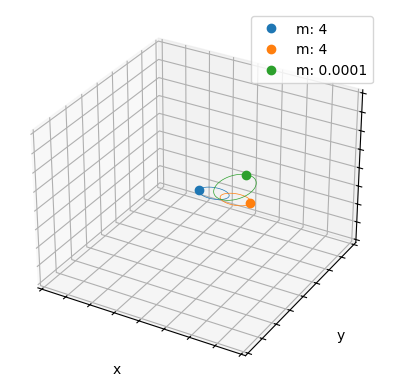

In [33]:
pic(len(solution)-1)

## Solve by badly self implementd Runge-Kutta 4th order

\begin{align}
\frac{dv}{dt} = a(x,t) && v(t_0) = v_0\\
\end{align}

$x(t_0+\Delta t) = x(t_0) + (\text{average slope}) \Delta t$

average slope = $(1/6)[k_1+2k_2+2k_3+k_4]$

\begin{gather}
k_1 = f(x_0,t_0)\\
k_2 = f(x_0+k_1\Delta t/2,t_0+ \Delta t/2)\\
k_3 = f(x_0+k_2\Delta t/2,t_0+ \Delta t/2)\\
k_4 = f(x_0+k_3\Delta t,t_0+ \Delta t)
\end{gather}

In [16]:
t_total = 1
dt = 0.00002
step = int(t_total/dt)

def progression(state):
    c_state = state.copy()
    n_objects = len(c_state)
    
    k1 = np.array([acceleration(c_state,i) for i in range(n_objects)])
    for i in range(len(c_state)):
        c_state[i] = object(c_state[i].m, state[i].q + dt/2*state[i].v, c_state[i].v)
        c_state[i] = object(c_state[i].m, c_state[i].q, (state[i].v + dt/2*k1[i]))

    k2 = np.array([acceleration(c_state,i) for i in range(n_objects)])
    for i in range(len(c_state)):
        c_state[i] = object(c_state[i].m, state[i].q + dt/2*state[i].v, c_state[i].v)
        c_state[i] = object(c_state[i].m, c_state[i].q, (state[i].v + dt/2*k2[i]))

    k3 = np.array([acceleration(c_state,i) for i in range(n_objects)])
    for i in range(len(c_state)):
        c_state[i] = object(c_state[i].m, state[i].q + dt/2*state[i].v, c_state[i].v)
        c_state[i] = object(c_state[i].m, c_state[i].q, (state[i].v + dt*k3[i]))

    k4 = np.array([acceleration(c_state,i) for i in range(n_objects)])
  
    avg_slope = (1/6)*(k1+2*k2+2*k3+k4)
        
    for i in range(len(state)):        
        new_v = state[i].v + avg_slope[i]*dt
        
        c_state[i] = object(c_state[i].m, state[i].q + new_v*dt, new_v)

    return c_state

solution = [obj_to_arr(init)]
state = init.copy()

for t in range(step):
    state_t = progression(state)
    solution.append(obj_to_arr(state_t))
    state = state_t

solution = np.array(solution)

<Figure size 640x480 with 0 Axes>

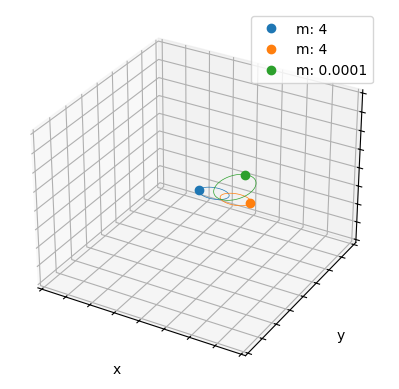

In [17]:
pic(step-1)

## Some result from Scipy

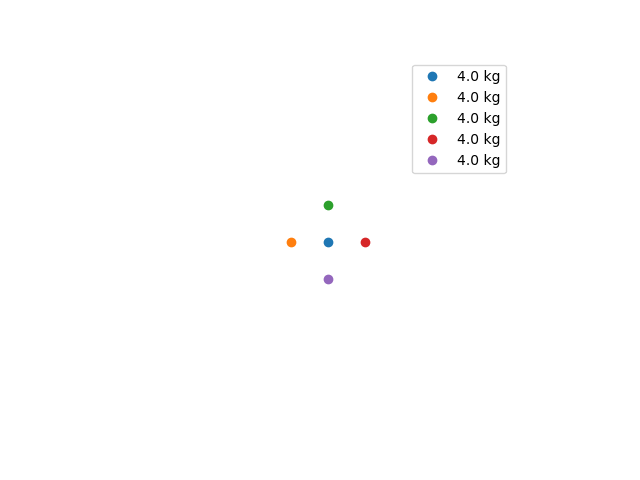

In [292]:
Image(filename="result/result4.gif")

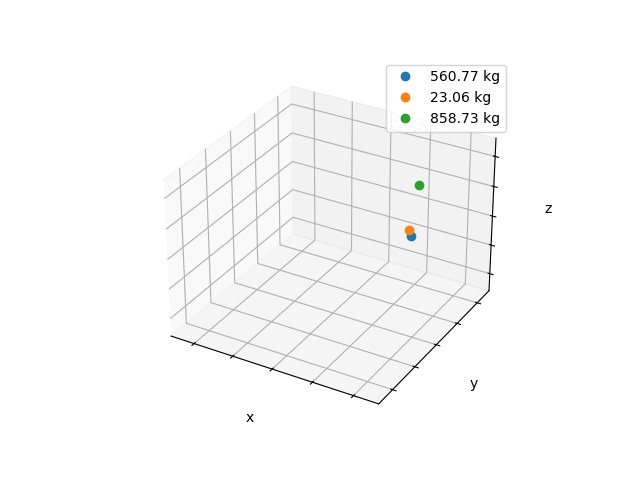

In [294]:
Image(filename="result/result7.gif")

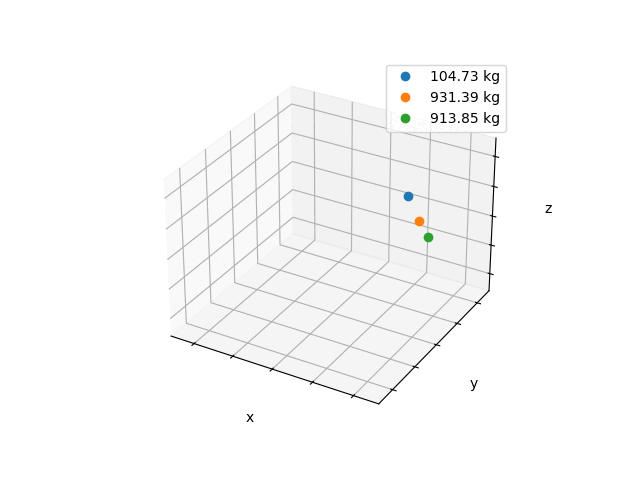

In [293]:
Image(filename="result/result6.gif")
#weird orbit between green and orange because I did not keep every frame

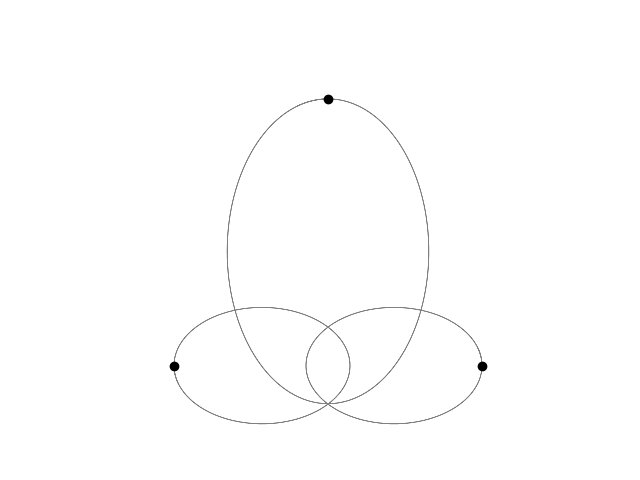

In [289]:
from IPython.display import Image
Image(filename="result/result1.gif")

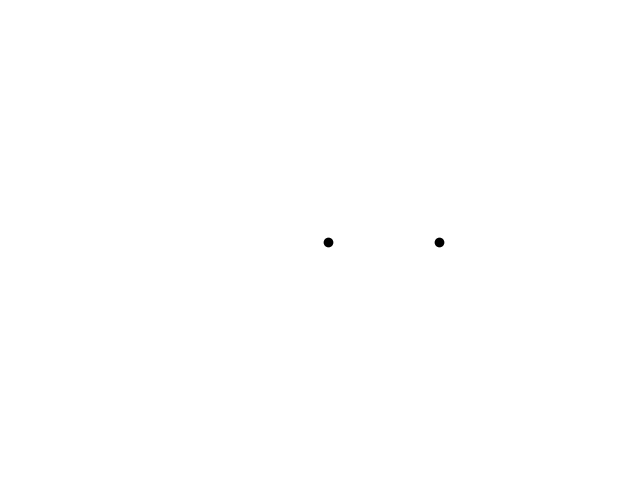

In [290]:
Image(filename="result/result2.gif")

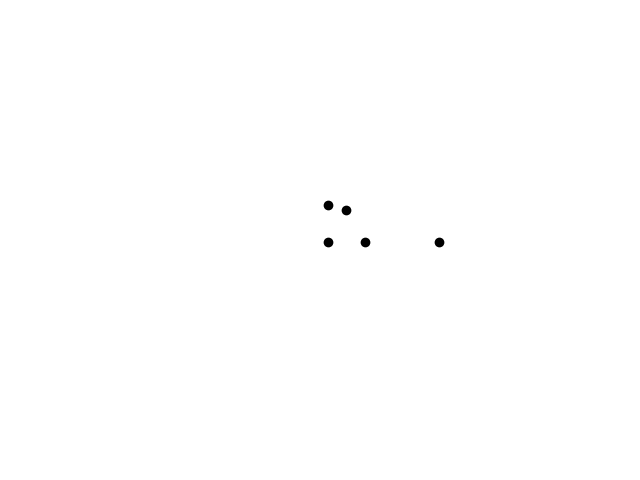

In [291]:
Image(filename="result/result3.gif")

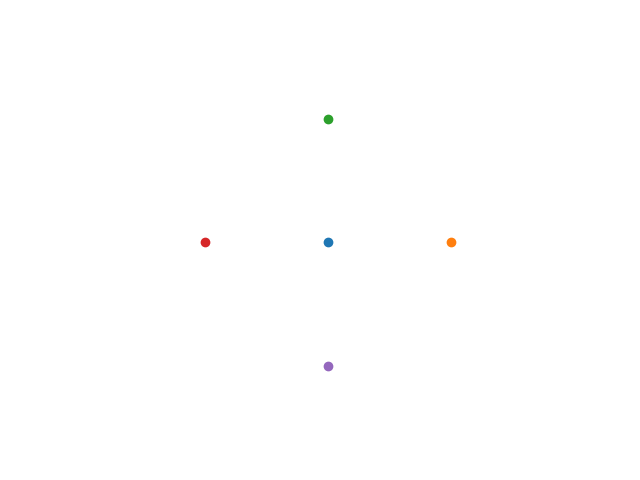

In [295]:
Image(filename="result/result9.gif")

## Some results from Runge-Kutta

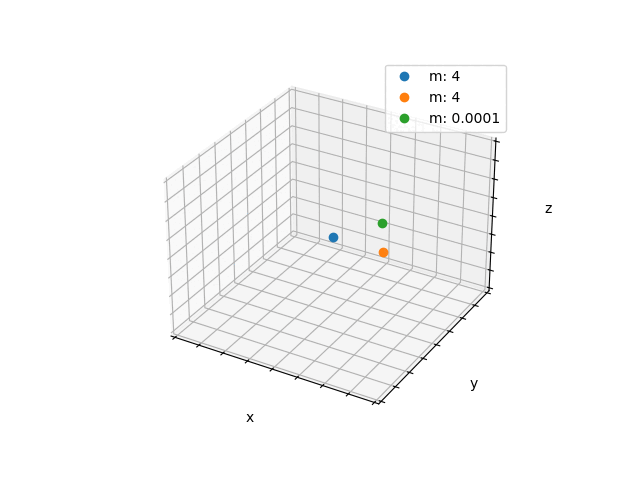

In [296]:
Image(filename="result/RK1.gif")

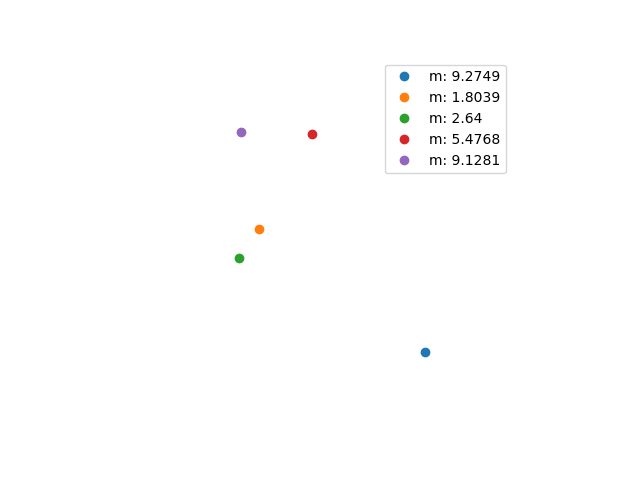

In [297]:
Image(filename="result/RK2.gif")

# Reference

https://www.marksmath.org/classes/Spring2018NumericalAnalysis/code/nBody.html